# Diffusion Models Session - Part 1: Foundations of Diffusion Models

**Alejandro Lancho Serrano, Vanessa Gómez Verdejo, Pablo Martínez Olmos, Emilio Parrado Hernández**

Departamento de Teoría de la Señal y Comunicaciones

**Universidad Carlos III de Madrid**

<img src='http://www.tsc.uc3m.es/~emipar/BBVA/INTRO/img/logo_uc3m_foot.jpg' width=400 />



## Table of Contents
1. [Setup](#setup)
2. [Recap & Objectives](#recap-objectives)
3. [Training](#training)
4. [Sampling](#sampling)
5. [Visualization](#visualization)


## Setting Things Up For This Session <a id="setup"></a>


In [1]:
# Set up the working directory dynamically
import os
import sys

In [2]:
# If you're using Google Colab, uncomment the following lines to mount Google Drive
# # Mount Google Drive
# from google.colab import drive
# drive.mount('/content/drive')

# # Define your directory path relative to your Google Drive base directory
# base_path = '/content/drive/My Drive/BBVA_cursos/MATERIAL_CURSOS/GEN_AI/Session_diffusion'

# # Add the base path to the system path for module imports
# if base_path not in sys.path:
#     sys.path.append(base_path)

# # Change the current working directory to the base path
# os.chdir(base_path)



In [3]:
from typing import Dict, Tuple  # For type annotations, making the code easier to understand and debug.
from tqdm import tqdm  # For displaying progress bars during loops (e.g., training or sampling).
import torch
import torch.nn as nn  # For defining neural network modules.
import torch.nn.functional as F  # For functional operations like activation functions or loss calculations.
from torch.utils.data import DataLoader  # For efficient data batching and loading.
from torchvision import models, transforms  # Predefined models and data transformations.
from torchvision.utils import save_image, make_grid  # For saving and visualizing images.
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation, PillowWriter  # For creating and saving animations (e.g., visualization of diffusion steps).
import numpy as np
from IPython.display import HTML  # For displaying HTML content like animations in Jupyter notebooks.
from diffusion_utilities import *  # This is an auxiliary file provided with some useful functions/classes.
import requests  # For making HTTP requests to download files directly from URLs.
from io import BytesIO  # For handling in-memory binary streams (used when loading files from URLs without saving to disk).

### NOTE: Checkpoints
If you are short on time, you can load pre-trained weights from a previous run. The notebook includes cells to:
- Save checkpoints to `./weights/`
- Load them later without retraining


## About this notebook <a id="recap-objectives"></a>

The slides and lecture notes carry the theory; this notebook is the implementation companion. We build, train, and sample a basic **DDPM** on a small **pixel-art sprites** dataset (Sprites by ElvGames, FrootsnVeggies by zrghr, kyrise), with the model blocks and plotting helpers in `diffusion_utilities.py`. Notation follows the lecture notes. A compact reminder of the mechanics is below; for the derivations, see the notes.


### A compact reminder

**Forward process** (fixed, no learning). With per-step variance $\beta_t$, signal factor $\alpha_t=1-\beta_t$, and cumulative product $\bar\alpha_t=\prod_{s\le t}\alpha_s$, we jump from a clean image $x_0$ to any noise level in one shot:
$$ x_t=\sqrt{\bar\alpha_t}\,x_0+\sqrt{1-\bar\alpha_t}\,\varepsilon,\qquad \varepsilon\sim\mathcal N(0,I). $$
$\bar\alpha_t\to1$ is almost no noise, $\bar\alpha_t\to0$ is almost pure noise ($x_T\approx\mathcal N(0,I)$).

**Reverse process** (what we learn). If we knew $x_0$, the reverse step would be the exact Gaussian
$$ q(x_{t-1}\mid x_t,x_0)=\mathcal N\!\big(c_1(t)\,x_t+c_2(t)\,x_0,\ \tilde\beta_t I\big), $$
with posterior weights $c_1,c_2$ fixed by the schedule. A generator never has $x_0$, so we train a network $\varepsilon_\theta(x_t,t)$ to predict the noise; that yields the stand-in $\hat x_0$, and the step plugs it in. We use a **U-Net** for $\varepsilon_\theta$: skip connections and multi-scale features, with the step $t$ embedded as an extra input.

<p align="center">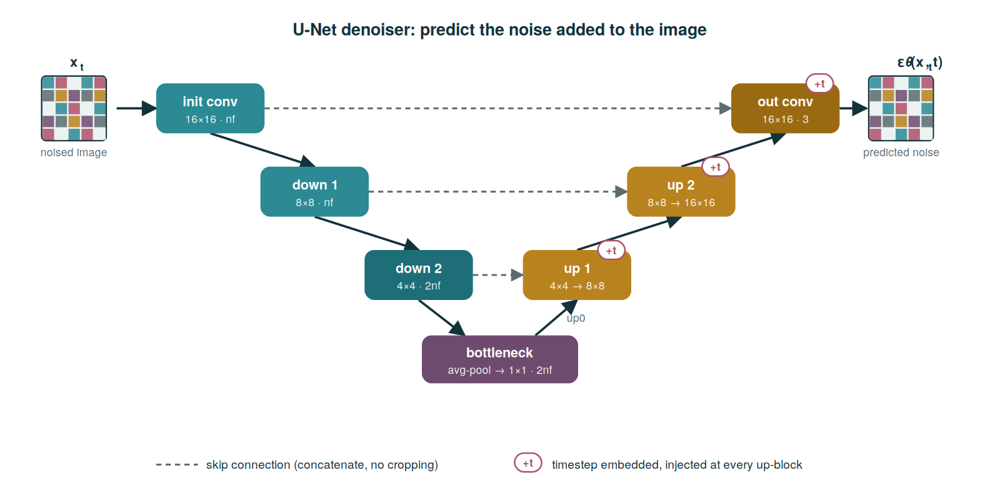<br><span style="font-size:13px; color:#5C6B70;">A simplified U-Net (our architecture) for the noise predictor &#949;<sub>&#952;</sub>(x<sub>t</sub>, t): skip connections concatenate matching-resolution features (no cropping), and the timestep is injected at every up-block.</span></p>


### A quick look in 2D

Sprites are $16\times16\times3$, so the core difficulty is easier to picture in 2D. Fix one noised point $x_t$ and ask which clean points $x_0$ could have produced it: many can, so the reverse step is a *distribution*, and the best single guess is the posterior mean $\mathbb{E}[x_0\mid x_t]$ — exactly what the network learns to supply. Below, each clean point is shaded by how plausibly it explains the observed $x_t$ (star).


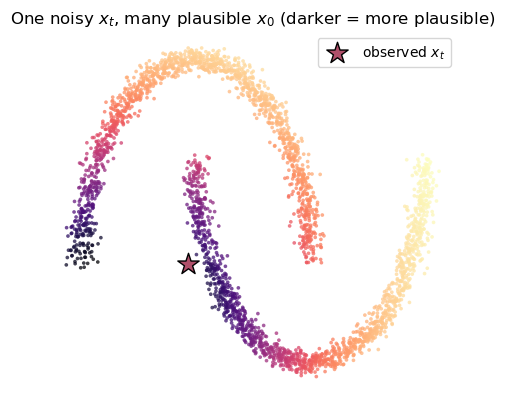

In [4]:
# --- self-contained 2D illustration (numpy + matplotlib only; does not touch the sprite model) ---
import numpy as np
import matplotlib.pyplot as plt

rng_toy = np.random.default_rng(7)

def two_moons(n, noise=0.08, rng=None):
    rng = rng or np.random.default_rng()
    n1, n2 = n // 2, n - n // 2
    a = np.pi * rng.random(n1)
    m1 = np.stack([np.cos(a), np.sin(a)], 1)
    b = np.pi * rng.random(n2)
    m2 = np.stack([1 - np.cos(b), 0.5 - np.sin(b)], 1)
    X = np.concatenate([m1, m2], 0)
    y = np.concatenate([np.zeros(n1, int), np.ones(n2, int)])
    X = (X - X.mean(0)) / X.std(0) * 1.3
    return (X + noise * rng.normal(size=X.shape)).astype(float), y

X0_toy, y_toy = two_moons(3000, rng=rng_toy)

# same kind of schedule as the sprite model, at a smaller T
T_toy = 150
beta_toy = np.linspace(5e-4, 0.08, T_toy)
abar_toy = np.cumprod(1.0 - beta_toy)

def q_sample_toy(x0, t, rng):
    ab = abar_toy[t - 1]
    return np.sqrt(ab) * x0 + np.sqrt(1 - ab) * rng.normal(size=x0.shape)

# fix one noised point at a moderate noise level, shade each clean x0 by how plausibly it explains it
t_show = 70
i_pt = 3
xt_point = q_sample_toy(X0_toy[i_pt:i_pt + 1], t_show, rng_toy)[0]

ab = abar_toy[t_show - 1]
mu = np.sqrt(ab) * X0_toy                       # mean of q(x_t | x0) for each clean point
d2 = ((xt_point - mu) ** 2).sum(1) / (1 - ab)
w = np.exp(-0.5 * d2); w /= w.sum()             # plausibility weight of each x0

fig, ax = plt.subplots(figsize=(4.4, 4.4))
ax.scatter(X0_toy[:, 0], X0_toy[:, 1], s=7, c=w, cmap="magma_r", alpha=0.75, linewidths=0)
ax.scatter([xt_point[0]], [xt_point[1]], marker="*", s=260, c="#B0506A",
           edgecolor="k", zorder=5, label=r"observed $x_t$")
ax.set_title(r"One noisy $x_t$, many plausible $x_0$ (darker = more plausible)")
ax.set_aspect("equal"); ax.axis("off"); ax.legend(loc="upper right")
plt.tight_layout(); plt.show()


In [5]:
class Unet(nn.Module):
    """
    A simplified U-Net architecture designed for diffusion models.
    This architecture supports timestep embeddings and residual connections.

    Args:
        in_channels (int): Number of channels in the input image.
        n_feat (int): Number of features in the intermediate layers. Default: 256.
        height (int): Height (and width) of the input image. Must be divisible by 4. Default: 28.
    """
    def __init__(self, in_channels, n_feat=256, height=28):
        super(Unet, self).__init__()

        # Validate height to ensure divisibility by 4
        assert height % 4 == 0, "Height must be divisible by 4 for down/up-sampling."

        # Save parameters
        self.in_channels = in_channels
        self.n_feat = n_feat
        self.h = height

        # Initial convolution block
        self.init_conv = ResidualConvBlock(in_channels, n_feat, is_res=True)

        # Down-sampling path
        self.down1 = UnetDown(n_feat, n_feat)        # Down-sample by a factor of 2
        self.down2 = UnetDown(n_feat, 2 * n_feat)    # Down-sample by another factor of 2

        # Convert feature maps to a vector with activation
        self.to_vec = nn.Sequential(
            nn.AvgPool2d(kernel_size=height // 4),  # Pool to a single spatial location
            nn.GELU()                              # Apply activation
        )

        # Timestep embedding layers
        self.timeembed1 = EmbedFC(1, 2 * n_feat)  # Embed timestep into high-dimensional space
        self.timeembed2 = EmbedFC(1, n_feat)

        # Up-sampling path
        self.up0 = nn.Sequential(
            nn.ConvTranspose2d(2 * n_feat, 2 * n_feat, kernel_size=self.h // 4, stride=self.h // 4),
            nn.GroupNorm(8, 2 * n_feat),
            nn.ReLU()
        )
        self.up1 = UnetUp(4 * n_feat, n_feat)
        self.up2 = UnetUp(2 * n_feat, n_feat)

        # Output block to reconstruct input channels
        self.out = nn.Sequential(
            nn.Conv2d(2 * n_feat, n_feat, kernel_size=3, stride=1, padding=1),
            nn.GroupNorm(8, n_feat),
            nn.ReLU(),
            nn.Conv2d(n_feat, self.in_channels, kernel_size=3, stride=1, padding=1)
        )

    def forward(self, x, t):
        """
        Forward pass through the U-Net.

        Args:
            x (torch.Tensor): Input image of shape (batch, in_channels, height, width).
            t (torch.Tensor): Timestep embedding of shape (batch, 1).

        Returns:
            torch.Tensor: Reconstructed image of shape (batch, in_channels, height, width).
        """
        # Initial convolution
        x = self.init_conv(x)

        # Down-sampling path
        down1 = self.down1(x)  # First down-sampling stage
        down2 = self.down2(down1)  # Second down-sampling stage

        # Convert to vector
        hiddenvec = self.to_vec(down2)

        # Timestep embeddings
        temb1 = self.timeembed1(t).view(-1, self.n_feat * 2, 1, 1)
        temb2 = self.timeembed2(t).view(-1, self.n_feat, 1, 1)

        # Up-sampling path
        up1 = self.up0(hiddenvec)
        up2 = self.up1(up1 + temb1, down2)  # Add timestep embedding
        up3 = self.up2(up2 + temb2, down1)  # Add timestep embedding

        # Final output
        out = self.out(torch.cat((up3, x), dim=1))  # Concatenate skip connection
        return out

Set the **noise schedule** ($\beta_t$ linear, $\alpha_t=1-\beta_t$, $\bar\alpha_t=\prod_{s\le t}\alpha_s$) and the training **hyperparameters** (U-Net width `n_feat`, $16\times16$ images, device, batch size, epochs, learning rate). The schedule cell also precomputes the posterior weights $c_1,c_2,\tilde\beta_t$ used at sampling.


In [6]:
# Hyperparameters

# Diffusion hyperparameters
timesteps = 500  # Number of timesteps for the forward and reverse diffusion processes
beta1 = 1e-4     # Starting value for the beta schedule (variance of noise added in the forward process)
beta2 = 0.02     # Final value for the beta schedule

# Network hyperparameters
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")  # Device configuration: Use GPU if available, otherwise use CPU
n_feat = 64  # Number of hidden dimensions for features (controls model capacity)
height = 16  # Spatial size of the input image (assumes square images of size 16x16)
save_dir = './weights/'  # Directory to save trained model weights

# Training hyperparameters
batch_size = 100  # Number of samples per training batch
n_epoch = 32      # Number of training epochs
lrate = 1e-3      # Initial learning rate for the optimizer


In [7]:
# ----- DDPM noise schedule (fixed, no learning) -----

# Linearly spaced beta_t from beta1 to beta2.
# Built over T+1 points (t = 0, 1, ..., T) so that index t indexes level t.
b_t = (beta2 - beta1) * torch.linspace(0, 1, timesteps + 1, device=device) + beta1

# Per-step signal factor alpha_t = 1 - beta_t.
alpha_t = 1.0 - b_t

# Cumulative product abar_t = prod_{s<=t} alpha_s, in log-space for numerical stability.
# abar_t is the signal weight in the one-shot identity x_t = sqrt(abar_t) x0 + sqrt(1-abar_t) eps.
ab_t = torch.cumsum(alpha_t.log(), dim=0).exp()
ab_t[0] = 1.0  # abar_0 = 1: no noise at the start

# ----- Posterior weights, precomputed from the schedule alone -----
# Exact reverse step given x0:  q(x_{t-1}|x_t,x0) = N(c1(t) x_t + c2(t) x0, beta_tilde_t * I).
# Use abar_{t-1} = abar_t / alpha_t, the consistent cumulative value at every t.
ab_prev = ab_t / alpha_t                                      # abar_{t-1}
one_minus_ab = 1.0 - ab_t
c1_t = alpha_t.sqrt() * (1.0 - ab_prev) / one_minus_ab        # trust in current state x_t
c2_t = ab_prev.sqrt() * b_t / one_minus_ab                    # trust in clean target x0
beta_tilde_t = (1.0 - ab_prev) / one_minus_ab * b_t           # exact posterior variance
# index 0 is never used at sampling time (steps run t = T, ..., 1); zero out the 1/0 there
c1_t[0] = 0.0
c2_t[0] = 0.0
beta_tilde_t[0] = 0.0


In [8]:
print(b_t)

tensor([1.0000e-04, 1.3980e-04, 1.7960e-04, 2.1940e-04, 2.5920e-04, 2.9900e-04,
        3.3880e-04, 3.7860e-04, 4.1840e-04, 4.5820e-04, 4.9800e-04, 5.3780e-04,
        5.7760e-04, 6.1740e-04, 6.5720e-04, 6.9700e-04, 7.3680e-04, 7.7660e-04,
        8.1640e-04, 8.5620e-04, 8.9600e-04, 9.3580e-04, 9.7560e-04, 1.0154e-03,
        1.0552e-03, 1.0950e-03, 1.1348e-03, 1.1746e-03, 1.2144e-03, 1.2542e-03,
        1.2940e-03, 1.3338e-03, 1.3736e-03, 1.4134e-03, 1.4532e-03, 1.4930e-03,
        1.5328e-03, 1.5726e-03, 1.6124e-03, 1.6522e-03, 1.6920e-03, 1.7318e-03,
        1.7716e-03, 1.8114e-03, 1.8512e-03, 1.8910e-03, 1.9308e-03, 1.9706e-03,
        2.0104e-03, 2.0502e-03, 2.0900e-03, 2.1298e-03, 2.1696e-03, 2.2094e-03,
        2.2492e-03, 2.2890e-03, 2.3288e-03, 2.3686e-03, 2.4084e-03, 2.4482e-03,
        2.4880e-03, 2.5278e-03, 2.5676e-03, 2.6074e-03, 2.6472e-03, 2.6870e-03,
        2.7268e-03, 2.7666e-03, 2.8064e-03, 2.8462e-03, 2.8860e-03, 2.9258e-03,
        2.9656e-03, 3.0054e-03, 3.0452e-

In [9]:
print(ab_t)

tensor([1.0000, 0.9998, 0.9996, 0.9994, 0.9991, 0.9988, 0.9985, 0.9981, 0.9977,
        0.9972, 0.9967, 0.9962, 0.9956, 0.9950, 0.9943, 0.9936, 0.9929, 0.9921,
        0.9913, 0.9905, 0.9896, 0.9887, 0.9877, 0.9867, 0.9857, 0.9846, 0.9835,
        0.9823, 0.9811, 0.9799, 0.9786, 0.9773, 0.9760, 0.9746, 0.9732, 0.9717,
        0.9702, 0.9687, 0.9671, 0.9655, 0.9639, 0.9622, 0.9605, 0.9588, 0.9570,
        0.9552, 0.9534, 0.9515, 0.9496, 0.9476, 0.9456, 0.9436, 0.9416, 0.9395,
        0.9374, 0.9352, 0.9331, 0.9309, 0.9286, 0.9263, 0.9240, 0.9217, 0.9193,
        0.9169, 0.9145, 0.9121, 0.9096, 0.9071, 0.9045, 0.9019, 0.8993, 0.8967,
        0.8940, 0.8914, 0.8886, 0.8859, 0.8831, 0.8803, 0.8775, 0.8747, 0.8718,
        0.8689, 0.8660, 0.8630, 0.8601, 0.8571, 0.8540, 0.8510, 0.8479, 0.8448,
        0.8417, 0.8386, 0.8354, 0.8323, 0.8291, 0.8259, 0.8226, 0.8194, 0.8161,
        0.8128, 0.8095, 0.8061, 0.8028, 0.7994, 0.7960, 0.7926, 0.7892, 0.7857,
        0.7823, 0.7788, 0.7753, 0.7718, 

In [10]:
# Initialize the U-Net model
# - `in_channels=3`: The input has 3 channels (e.g., RGB images).
# - `n_feat=n_feat`: Hidden feature dimension, controlling model capacity.
# - `height=height`: Height and width of the input image, must be divisible by 4 for down- and up-sampling.
# - `.to(device)`: Moves the model to the specified device (CPU or GPU) for computation.
nn_model = Unet(in_channels=3, n_feat=n_feat, height=height).to(device)

# Training

## Dataset

To make this exercise both fun and fast to train, we'll use a small but expressive dataset of colorful **pixel art sprites**. These include characters, objects, and food items from:

- **Sprites by ElvGames**
- **FrootsnVeggies by zrghr**
- **Kyrise asset packs**

These low-resolution, visually distinct images are perfect for experimentation and allow us to quickly assess whether conditioning is working based on visual output.

In [11]:
# load dataset like this if you have it in your directory
# dataset = CustomDataset("./sprites_1788_16x16.npy", "./sprite_labels_nc_1788_16x16.npy", transform, null_context=False)

def download_file(url, local_filename):
    with requests.get(url, stream=True) as r:
        r.raise_for_status()
        with open(local_filename, 'wb') as f:
            for chunk in r.iter_content(chunk_size=8192):
                f.write(chunk)
    return local_filename

# Build full URLs
base_url = "https://huggingface.co/datasets/a-lancho/genAI-course-sprites/resolve/main/"

sprites_url = base_url + "sprites_1788_16x16.npy"
labels_url = base_url + "sprite_labels_nc_1788_16x16.npy"

# Download to local files
download_file(sprites_url, "sprites.npy")
download_file(labels_url, "labels.npy")

# Now you can use your class as before:
dataset = CustomDataset("sprites.npy", "labels.npy", transform, null_context=False)
dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=True, num_workers=1)

# construct optimizer
optim = torch.optim.Adam(nn_model.parameters(), lr=lrate)


sprite shape: (89400, 16, 16, 3)
labels shape: (89400, 5)


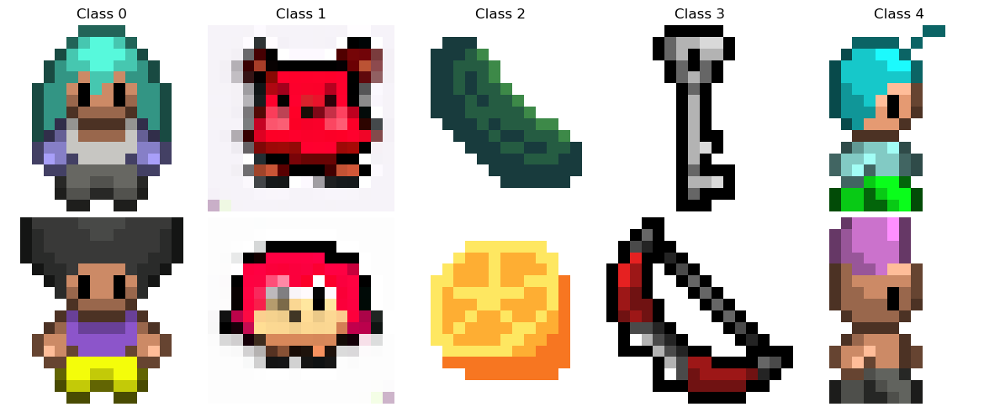

In [12]:
# Visualize 2 samples per class in a 2x5 grid
import matplotlib.pyplot as plt

# Convert one-hot labels to class indices
def one_hot_to_index(labels):
    return labels.argmax(dim=1).tolist()

# Get a batch large enough to contain at least 2 examples of each class
images, labels = next(iter(DataLoader(dataset, batch_size=200, shuffle=True)))

# Initialize storage for 2 samples per class
n_classes = labels.shape[1]
samples_per_class = {i: [] for i in range(n_classes)}

# Collect 2 images per class
for img, label in zip(images, labels):
    class_idx = label.argmax().item()
    if len(samples_per_class[class_idx]) < 2:
        samples_per_class[class_idx].append(img)
    if all(len(v) == 2 for v in samples_per_class.values()):
        break

# Plot in a 2x5 grid
fig, axs = plt.subplots(2, 5, figsize=(12, 5))
for class_idx, imgs in samples_per_class.items():
    for row in range(2):
        img = (imgs[row].permute(1, 2, 0).clip(-1, 1) + 1) / 2  # [-1, 1] → [0, 1]
        axs[row, class_idx].imshow(img.detach().cpu().numpy())
        axs[row, class_idx].axis('off')
        if row == 0:
            axs[row, class_idx].set_title(f"Class {class_idx}")

plt.tight_layout()
plt.show()

Forward process in one shot, $x_t=\sqrt{\bar\alpha_t}\,x_0+\sqrt{1-\bar\alpha_t}\,\varepsilon$. The $\varepsilon$ drawn here is exactly the target the network learns to predict.


In [18]:
# Forward process in one shot: corrupt a clean image x0 to noise level t.
def perturb_input(x0, t, eps):
    """
    Apply the forward identity  x_t = sqrt(abar_t) x0 + sqrt(1 - abar_t) eps.

    Parameters
    ----------
    x0  : clean image(s), the data we start from.
    t   : time step(s); selects how much signal survives via abar_t.
    eps : Gaussian noise of the same shape as x0 (the eps the network learns to predict).

    Returns
    -------
    x_t : the noised image at level t.
    """
    # [t, None, None, None] reshapes the scalar abar_t so it broadcasts over (B, C, H, W).
    signal = ab_t[t, None, None, None].sqrt() * x0             # sqrt(abar_t) * x0
    noise  = (1.0 - ab_t[t, None, None, None]).sqrt() * eps    # sqrt(1 - abar_t) * eps
    return signal + noise


### Training: predict the noise

For each image, draw a random step $t$ and noise $\varepsilon$, corrupt to $x_t$, and regress the network onto that noise:
$$ \mathcal{L}(\theta)=\mathbb{E}_{t,x_0,\varepsilon}\big\|\varepsilon-\varepsilon_\theta(x_t,t)\big\|^2. $$
One random $t$ per image, so there is no chain to simulate. (A GPU is recommended.)


In [19]:
# Set the model to training mode
nn_model.train()

for ep in range(n_epoch):
    print(f'epoch {ep}')

    # linearly decay the learning rate over training
    optim.param_groups[0]['lr'] = lrate * (1 - ep / n_epoch)

    pbar = tqdm(dataloader, mininterval=2)
    for x0, _ in pbar:                          # x0: clean images; labels ignored in Part 1
        optim.zero_grad()
        x0 = x0.to(device)

        # draw fresh noise and one random step per image
        eps = torch.randn_like(x0)                                   # epsilon ~ N(0, I)
        t = torch.randint(1, timesteps + 1, (x0.shape[0],)).to(device)

        # corrupt to level t in one shot:  x_t = sqrt(abar_t) x0 + sqrt(1 - abar_t) eps
        x_t = perturb_input(x0, t, eps)

        # network predicts the injected noise; t is passed normalized to [0, 1]
        eps_theta = nn_model(x_t, t / timesteps)                     # eps_theta(x_t, t)

        # noise-prediction loss:  || eps - eps_theta ||^2
        loss = F.mse_loss(eps_theta, eps)

        loss.backward()
        optim.step()

    # periodically checkpoint
    if ep % 4 == 0 or ep == int(n_epoch - 1):
        if not os.path.exists(save_dir):
            os.mkdir(save_dir)
        torch.save(nn_model.state_dict(), save_dir + f"model_{ep}.pth")
        print(f'Saved model at {save_dir}model_{ep}.pth')


epoch 0


100%|██████████| 894/894 [00:05<00:00, 156.67it/s]


Saved model at ./weights/model_0.pth
epoch 1


100%|██████████| 894/894 [00:05<00:00, 176.98it/s]


epoch 2


100%|██████████| 894/894 [00:05<00:00, 178.39it/s]


epoch 3


100%|██████████| 894/894 [00:04<00:00, 179.03it/s]


epoch 4


100%|██████████| 894/894 [00:05<00:00, 175.14it/s]


Saved model at ./weights/model_4.pth
epoch 5


100%|██████████| 894/894 [00:05<00:00, 178.10it/s]


epoch 6


100%|██████████| 894/894 [00:04<00:00, 179.17it/s]


epoch 7


100%|██████████| 894/894 [00:05<00:00, 174.13it/s]


epoch 8


100%|██████████| 894/894 [00:05<00:00, 175.61it/s]


Saved model at ./weights/model_8.pth
epoch 9


100%|██████████| 894/894 [00:05<00:00, 176.96it/s]


epoch 10


100%|██████████| 894/894 [00:05<00:00, 176.89it/s]


epoch 11


100%|██████████| 894/894 [00:05<00:00, 178.20it/s]


epoch 12


100%|██████████| 894/894 [00:05<00:00, 177.43it/s]


Saved model at ./weights/model_12.pth
epoch 13


100%|██████████| 894/894 [00:05<00:00, 177.70it/s]


epoch 14


100%|██████████| 894/894 [00:04<00:00, 178.89it/s]


epoch 15


100%|██████████| 894/894 [00:05<00:00, 178.60it/s]


epoch 16


100%|██████████| 894/894 [00:05<00:00, 177.88it/s]


Saved model at ./weights/model_16.pth
epoch 17


100%|██████████| 894/894 [00:05<00:00, 177.87it/s]


epoch 18


100%|██████████| 894/894 [00:04<00:00, 180.89it/s]


epoch 19


100%|██████████| 894/894 [00:05<00:00, 178.78it/s]


epoch 20


100%|██████████| 894/894 [00:05<00:00, 177.11it/s]


Saved model at ./weights/model_20.pth
epoch 21


100%|██████████| 894/894 [00:05<00:00, 177.37it/s]


epoch 22


100%|██████████| 894/894 [00:05<00:00, 173.87it/s]


epoch 23


100%|██████████| 894/894 [00:05<00:00, 177.33it/s]


epoch 24


100%|██████████| 894/894 [00:05<00:00, 162.53it/s]


Saved model at ./weights/model_24.pth
epoch 25


100%|██████████| 894/894 [00:05<00:00, 178.58it/s]


epoch 26


100%|██████████| 894/894 [00:04<00:00, 179.29it/s]


epoch 27


100%|██████████| 894/894 [00:04<00:00, 179.44it/s]


epoch 28


100%|██████████| 894/894 [00:05<00:00, 175.67it/s]


Saved model at ./weights/model_28.pth
epoch 29


100%|██████████| 894/894 [00:05<00:00, 173.63it/s]


epoch 30


100%|██████████| 894/894 [00:05<00:00, 165.96it/s]


epoch 31


100%|██████████| 894/894 [00:05<00:00, 175.20it/s]

Saved model at ./weights/model_31.pth


# Sampling

### Sampling

For $t=T,\dots,1$: predict $\hat\varepsilon=\varepsilon_\theta(x_t,t)$, recover $\hat x_0=(x_t-\sqrt{1-\bar\alpha_t}\,\hat\varepsilon)/\sqrt{\bar\alpha_t}$, take the posterior step $c_1(t)\,x_t+c_2(t)\,\hat x_0$, and add noise $\sigma_t z$ (here $\sigma_t^2=\beta_t$; none at $t=1$).


In [20]:
# One reverse step: recover the guess for x0, take the exact-posterior step, add noise back.
def denoise_add_noise(x_t, t, eps_theta, z=None):
    """
    Reverse step  x_t -> x_{t-1}  for ancestral (DDPM) sampling.

    Parameters
    ----------
    x_t       : current noisy image at step t.
    t         : integer step index.
    eps_theta : the network's noise prediction at (x_t, t).
    z         : fresh noise for this step; pass 0 at the final step (t = 1).
    """
    if z is None:
        z = torch.randn_like(x_t)

    # 1) network's guess of the clean datum (invert the forward identity)
    x0_hat = (x_t - (1.0 - ab_t[t]).sqrt() * eps_theta) / ab_t[t].sqrt()

    # 2) exact reverse mean with the guess plugged in:  c1(t) x_t + c2(t) x0_hat
    mean = c1_t[t] * x_t + c2_t[t] * x0_hat

    # 3) add the reverse-step spread; sigma_t^2 = beta_t
    #    (for the KL-optimal choice, replace b_t[t] with beta_tilde_t[t])
    sigma_t = b_t[t].sqrt()
    return mean + sigma_t * z


In [21]:
# Ancestral (DDPM) sampling: start from pure noise x_T and walk back to x_0.
@torch.no_grad()
def sample_ddpm(n_sample, save_rate=20):
    """
    Returns the final samples and a stack of intermediates for visualization.
    """
    # start from pure noise:  x_T ~ N(0, I)
    x_t = torch.randn(n_sample, 3, height, height).to(device)

    intermediate = []
    for i in range(timesteps, 0, -1):
        print(f'sampling timestep {i:3d}', end='\r')

        # step index for the network, normalized to [0, 1]
        t = torch.tensor([i / timesteps])[:, None, None, None].to(device)

        # fresh noise for this step, except none at the final step
        z = torch.randn_like(x_t) if i > 1 else 0

        # predict the noise, then take one reverse step
        eps_theta = nn_model(x_t, t)
        x_t = denoise_add_noise(x_t, i, eps_theta, z)

        if i % save_rate == 0 or i == timesteps or i < 8:
            intermediate.append(x_t.detach().cpu().numpy())

    intermediate = np.stack(intermediate)
    return x_t, intermediate


# Visualization

#### View Epoch 0

In [22]:
def load_pth_from_url(url):
    response = requests.get(url)
    response.raise_for_status()
    buffer = BytesIO(response.content)
    state_dict = torch.load(buffer, map_location=device)  # or 'cuda' if available
    return state_dict

In [23]:
model_url = "https://huggingface.co/a-lancho/genAI-course-sprites/resolve/main/model_0.pth"

state_dict = load_pth_from_url(model_url)
nn_model.load_state_dict(state_dict)

nn_model.eval()
print("Loaded in Model")

Loaded in Model


/tmp/ipykernel_663461/1134008309.py:5: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state_dict = torch.load(buffer, map_location=device)  # or 'cuda' if available


In [24]:
# If you have the model weights saved locally, you can load them like this:
# # load in model weights and set to eval mode
# nn_model.load_state_dict(torch.load(f"{save_dir}model_0.pth", map_location=device))
# nn_model.eval()
# print("Loaded in Model")

In [25]:
# visualize samples
plt.clf()
samples, intermediate_ddpm = sample_ddpm(32)
animation_ddpm = plot_sample(intermediate_ddpm,32,4,save_dir, "ani_run", None, save=False)
HTML(animation_ddpm.to_jshtml())

<Figure size 640x480 with 0 Axes>

#### View Epoch 4

In [26]:
model_url = "https://huggingface.co/a-lancho/genAI-course-sprites/resolve/main/model_4.pth"

state_dict = load_pth_from_url(model_url)
nn_model.load_state_dict(state_dict)

nn_model.eval()
print("Loaded in Model")

Loaded in Model


/tmp/ipykernel_663461/1134008309.py:5: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state_dict = torch.load(buffer, map_location=device)  # or 'cuda' if available


In [27]:
# visualize samples
plt.clf()
samples, intermediate_ddpm = sample_ddpm(32)
animation_ddpm = plot_sample(intermediate_ddpm,32,4,save_dir, "ani_run", None, save=False)
HTML(animation_ddpm.to_jshtml())

<Figure size 640x480 with 0 Axes>

#### View Epoch 8

In [28]:
model_url = "https://huggingface.co/a-lancho/genAI-course-sprites/resolve/main/model_8.pth"

state_dict = load_pth_from_url(model_url)
nn_model.load_state_dict(state_dict)

nn_model.eval()
print("Loaded in Model")

Loaded in Model


/tmp/ipykernel_663461/1134008309.py:5: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state_dict = torch.load(buffer, map_location=device)  # or 'cuda' if available


In [29]:
# visualize samples
plt.clf()
samples, intermediate_ddpm = sample_ddpm(32)
animation_ddpm = plot_sample(intermediate_ddpm,32,4,save_dir, "ani_run", None, save=False)
HTML(animation_ddpm.to_jshtml())

<Figure size 640x480 with 0 Axes>

#### View Epoch 31

In [30]:
model_url = "https://huggingface.co/a-lancho/genAI-course-sprites/resolve/main/model_31.pth"

state_dict = load_pth_from_url(model_url)
nn_model.load_state_dict(state_dict)

nn_model.eval()
print("Loaded in Model")

Loaded in Model


/tmp/ipykernel_663461/1134008309.py:5: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state_dict = torch.load(buffer, map_location=device)  # or 'cuda' if available


In [31]:
# visualize samples
plt.clf()
samples, intermediate_ddpm = sample_ddpm(32)
animation_ddpm = plot_sample(intermediate_ddpm,32,4,save_dir, "ani_run", None, save=False)
HTML(animation_ddpm.to_jshtml())

<Figure size 640x480 with 0 Axes>

# Acknowledgments

The material of this activity was partly taken from the course [How Diffusion Models Work](https://www.deeplearning.ai/short-courses/how-diffusion-models-work/) from [DeepLearning.AI](https://www.deeplearning.ai/). The original code of the DeepLearning.AI course was modified from, https://github.com/cloneofsimo/minDiffusion

**Dataset**: Sprites by ElvGames, [FrootsnVeggies](https://zrghr.itch.io/froots-and-veggies-culinary-pixels) and  [kyrise](https://kyrise.itch.io/)   
  
Diffusion model is based on the paper [Denoising Diffusion Probabilistic Models](https://arxiv.org/abs/2006.11239)

<!-- and [Denoising Diffusion Implicit Models](https://arxiv.org/abs/2010.02502) -->


### References

[1] Yang, Y., Jin, M., Wen, H., Zhang, C., Liang, Y., Ma, L., ... & Wen, Q. (2024). [A survey on diffusion models for time series and spatio-temporal data](https://arxiv.org/abs/2404.18886). arXiv preprint arXiv:2404.18886.

[2] Bishop, C. M., Bishop, H. & Cham, S. (ed.) (2023). Deep Learning - Foundations and Concepts. ISBN: 978-3-031-45468-4


---
**End of Part 1.** Proceed to **Part 2** for conditioning and guidance.